# Taller 2

* María Sofía Uribe
* Javier Daza Olivella

Primero instalamos librerías necesarias y verificamos versiones de las librerías necesarias

In [1]:
!pip install --no-cache-dir -U "numpy<2.0" "pandas<2.2" "autogluon==1.3.1"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 244.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 197.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 230.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of huggingface-hub[torch] to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of thinc to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 259.5/259.5 kB 18.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of openxlab to determine which version is compatible with other requirements. This could take a while.
INFO: pip is still looking at multiple versions of openxlab to determine which version is compatible with o

In [2]:
# librerías estándar
import os
import time
import math
import glob
import shutil
import random
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm
from pathlib import Path
import matplotlib.pyplot as plt
from collections import Counter

# librerías de deep learning
import torch
import torch.nn as nn
import torchvision.transforms as T
from torchvision import models, transforms
from torchvision.models import ResNet50_Weights
from torch.utils.data import DataLoader, Dataset

# AutoGluon
from autogluon.common import space
from autogluon.tabular import TabularDataset, TabularPredictor

# scikit-learn
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import accuracy_score, f1_score, classification_report, confusion_matrix

Ahora declaramos los directorios en donde se encontrarán las imágenes, clases y las anotaciones correspondientes

In [3]:
DATA_DIR = os.path.join("/kaggle/input", "labelme-12-50k-tar-gz")
TRAIN_DIR = os.path.join(DATA_DIR, "train")
TRAIN_ANNOT_PATH = os.path.join(TRAIN_DIR, "annotation.txt")
TEST_DIR = os.path.join(DATA_DIR, "test")
TEST_ANNOT_PATH = os.path.join(TEST_DIR, "annotation.txt")
CLASSES_TXT_PATH = os.path.join(DATA_DIR, "classes.txt")


Seleccionamos los modelos pre-entrenados que se usarán como extractores de características y cargamos la lista de clases
del dataset LabelMe-12-50k desde un archivo de texto

In [4]:

SAMPLE_FRACTION = 1.0
RANDOM_STATE = 42

BACKBONES = ['resnet50', 'mobilenet_v2']

with open(CLASSES_TXT_PATH, 'r') as f:
    class_dict = {i+1: line.strip() for i, line in enumerate(f)}
class_dict[13] = 'clutter'
print(class_dict)
CLASS_NAMES = list(class_dict.values())

{1: 'person', 2: 'car', 3: 'building', 4: 'window', 5: 'tree', 6: 'sign', 7: 'door', 8: 'bookshelf', 9: 'chair', 10: 'table', 11: 'keyboard', 12: 'head', 13: 'clutter'}


Ahora definimos algunas funciones auxiliares para construir índices de imágenes y cargar anotaciones del dataset LabelMe-12-50k, estas funciones nos permiten indexar las imágenes del conjunto de datos y asociarlas con sus respectivas etiquetas de forma rápida.

In [7]:
_image_index_cache = {}

def build_image_index(split: str):
    """
    Construye un índice que mapea los nombres de archivo de imágenes a sus rutas completas.

    Args:
        split (str): Nombre de la partición del dataset ('train' o 'test').

    Returns:
        dict: Diccionario donde las claves son los nombres de archivos .jpg y los valores son sus rutas completas.
    """
    global _image_index_cache
    key = f"{DATA_DIR}|{split}"
    if key in _image_index_cache:
        return _image_index_cache[key]

    base = Path(DATA_DIR) / split
    index = {}
    for p in tqdm(list(base.rglob("*.jpg")), desc=f"Indexing {split} images"):
        index.setdefault(p.name, str(p))
    _image_index_cache[key] = index
    return index

In [8]:
def _first_one_token_index(tokens):
    """
    Encuentra el índice (iniciando en 1) del primer token con valor '1' o que comience con '1.' en una lista.
    Args:
        tokens (list[str]): Lista de valores de etiquetas de una línea del archivo de anotaciones.

    Returns:
        int: Índice correspondiente a la clase detectada, o 13 (clutter) si no se encuentra ninguna coincidencia.
    """
    for i, t in enumerate(tokens, start=1):
        if t == '1' or t.startswith('1.'):
            return i
    return 13

In [9]:
def load_annotations(split: str) -> pd.DataFrame:
    """
    Carga las anotaciones del dataset LabelMe-12-50k y las asocia con las rutas de las imágenes.

    Args:
        split (str): Nombre de la partición del dataset ('train' o 'test').

    Returns:
        pd.DataFrame: DataFrame con dos columnas:
            - 'img_path': ruta completa de cada imagen
            - 'label': índice numérico de la clase correspondiente
    """
    ann_file = TRAIN_ANNOT_PATH if split == "train" else TEST_ANNOT_PATH
    img_index = build_image_index(split)

    img_paths, labels = [], []
    missing = 0

    with open(ann_file, "r") as f:
        lines = f.readlines()

    for line in tqdm(lines, desc=f"Parsing {split} annotations", unit="img"):
        parts = line.split()
        if not parts:
            continue

        img_name = parts[0] + ".jpg"
        label_idx = _first_one_token_index(parts[1:])

        path = img_index.get(img_name)
        if path is None:
            missing += 1
            continue

        img_paths.append(path)
        labels.append(label_idx)

    if missing:
        print(f"{missing} images from annotation file file {ann_file} were not found in {DATA_DIR}/{split}")

    return pd.DataFrame({"img_path": img_paths, "label": labels})




Ahora construímos con las funciones previas los dataframes de train y test

In [10]:
train_df = load_annotations("train")

Parsing train annotations: 100%|██████████| 40000/40000 [00:00<00:00, 491830.28img/s]


In [11]:
test_df = load_annotations("test")

Parsing test annotations: 100%|██████████| 10000/10000 [00:00<00:00, 466064.85img/s]


Identificamos si hay imágenes faltantes en alguno de los dos datasets

In [12]:

train_df['exists'] = train_df['img_path'].apply(os.path.exists)
test_df['exists']  = test_df['img_path'].apply(os.path.exists)
missing_train = (~train_df['exists']).sum()
missing_test  = (~test_df['exists']).sum()
print(f"Faltantes en train: {missing_train} | Faltantes en test: {missing_test}")


Faltantes en train: 0 | Faltantes en test: 0


Revisamos cuántas muestras hay en cada clase tanto en train como test

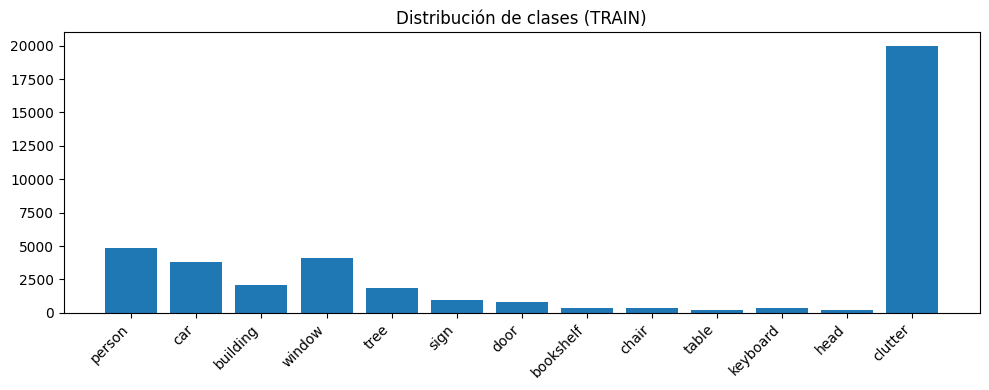

In [13]:
# Conteos por clase
train_counts = train_df['label'].value_counts().sort_index()
test_counts  = test_df['label'].value_counts().sort_index()

fig = plt.figure(figsize=(10,4))
plt.bar(range(len(CLASS_NAMES)), [train_counts.get(i+1,0) for i in range(len(CLASS_NAMES))])
plt.xticks(range(len(CLASS_NAMES)), CLASS_NAMES, rotation=45, ha='right')
plt.title('Distribución de clases (TRAIN)')
plt.tight_layout()
plt.show()

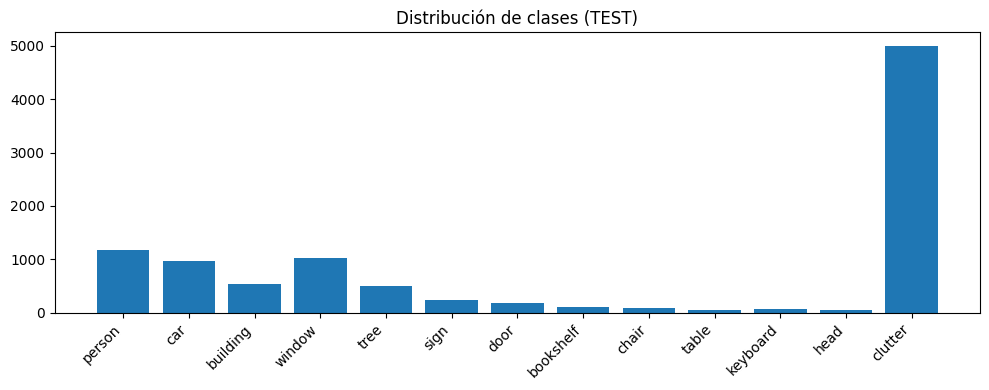

In [14]:
fig = plt.figure(figsize=(10,4))
plt.bar(range(len(CLASS_NAMES)), [test_counts.get(i+1,0) for i in range(len(CLASS_NAMES))])
plt.xticks(range(len(CLASS_NAMES)), CLASS_NAMES, rotation=45, ha='right')
plt.title('Distribución de clases (TEST)')
plt.tight_layout()
plt.show()

Vemos que en ambos datasets hay un desbalance evidente, En el primer gráfico observamos que la clase clutter domina el conjunto de entrenamiento, con alrededor de 20 000 imágenes, lo que representa la mitad del total de datos (40 000). Esto concuerda con la descripción del dataset, que indica que el 50 % de las imágenes son regiones aleatorias sin un objeto centrado.

Entre las clases con objetos definidos, destacan person, car y window, que tienen entre 3 000 y 5000 ejemplos cada una.
Clases como building, tree y sign aparecen con frecuencia intermedia (entre 1 000 y 3 000 ejemplos).
Clases como door, bookshelf, chair, table, keyboard y head son minoría, con menos de 500 ejemplos en algunos casos.


El segundo gráfico muestra una tendencia muy similar en la distribución de clases del conjunto de prueba. La clase "clutter" también domina (≈ 5 000 imágenes), seguida de person, car y window, con cantidades proporcionales a las del conjunto de entrenamiento.

Esto confirma que la división de datos preserva la proporción de clases entre entrenamiento y prueba


Ahora definimos una función para observar algunas muestras de cada clase del conjunto de entrenamiento

In [15]:
def show_examples(df, classes_to_show=range(len(CLASS_NAMES)), per_class=5, seed=RANDOM_STATE):
    random.seed(seed)
    samples = []
    for c in classes_to_show:

        sub = df[df['label'] == c]
        sub = sub[sub['exists'] == True]
        if len(sub) == 0:
            continue
        picks = sub.sample(min(per_class, len(sub)), random_state=seed)
        for _, row in picks.iterrows():
            samples.append((c, row['img_path']))
    if not samples:
        print("No hay imágenes disponibles para mostrar.")
        return
    n = len(samples)
    cols = per_class
    rows = math.ceil(n / cols)
    plt.figure(figsize=(3*cols, 3*rows))
    for i, (c, p) in enumerate(samples, 1):
        try:
            img = Image.open(p).convert('RGB')
            plt.subplot(rows, cols, i)
            plt.imshow(img)
            plt.axis('off')
            plt.title(CLASS_NAMES[c-1])
        except Exception as e:
            pass
    plt.tight_layout()
    plt.show()


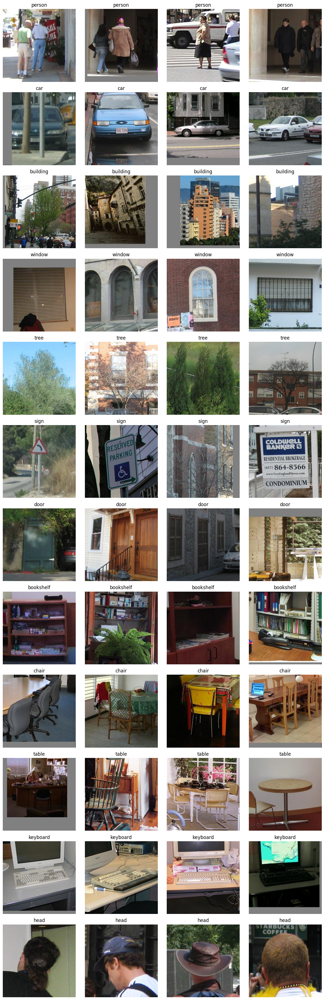

In [16]:
show_examples(train_df, classes_to_show=range(1, min(13, len(CLASS_NAMES))), per_class=4)

In [17]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

Ahora definimos una clase para cargar las imágenes y las etiquetas desde los dataframes creados previamente

In [18]:
class ImageListDataset(Dataset):
    """
    Clase que representa un dataset de PyTorch para cargar imágenes y etiquetas desde un DataFrame.
    Parámetros:
        df (pd.DataFrame): DataFrame con columnas 'img_path' y 'label'.
        size (int, opcional): Lado al que se redimensiona la imagen. Por defecto 224.
    """
    def __init__(self, df, size=224):
        self.paths = df['img_path'].tolist()
        self.labels = df['label'].astype(int).tolist()

        # transformaciones compatibles con backbones pre-entrenados en imagenet
        self.transform = T.Compose([
            T.Resize((size, size)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
        ])
    def __len__(self):
        """Devuelve el número de muestras disponibles en el dataset."""
        return len(self.paths)
        
    def __getitem__(self, idx):
        """
        Carga y transforma la imagen correspondiente al índice solicitado. Si la imagen no existe o está corrupta, se crea un tensor negro
            del tamaño 224x224 para no interrumpir el pipeline de extracción.

        Retorna:
            tuple(torch.Tensor, int, str): (imagen_transformada, etiqueta, directorio de la imagen)
        """
        path = self.paths[idx]
        try:
            img = Image.open(path).convert('RGB')
        except:
            # Imagen faltante/corrupta => tensor negro
            img = Image.new('RGB', (224,224), (0,0,0))
        x = self.transform(img)
        y = self.labels[idx]
        return x, y, path

def get_backbone(backbone_name: str):
    """
    Crea y devuelve un backbone pre-entrenado en ImageNet para extracción de características.El clasificador final del modelo se reemplaza por una capa identidad para
    devolver el vector de características previo a la clasificación.

    Parámetros:
        backbone_name (str): Nombre del backbone ('resnet50' o 'mobilenet_v2').

    Retorna:
        tuple(torch.nn.Module, int, int):
            - m: modelo backbone con la cabeza de clasificación sustituida por la identidad (devuelve las features)
            - feat_dim: dimensión del vector de características extraído
            - size: tamaño de entrada esperado (lado) para las transformaciones
    Raises:
        ValueError: si el backbone no está soportado.
    """
    if backbone_name == 'resnet50':
        m = models.resnet50(weights=models.ResNet50_Weights.IMAGENET1K_V2)
        feat_dim = m.fc.in_features
        m.fc = torch.nn.Identity()
        return m, feat_dim, 224
    elif backbone_name == 'mobilenet_v2':
        m = models.mobilenet_v2(weights=models.MobileNet_V2_Weights.IMAGENET1K_V1)
        feat_dim = m.classifier[1].in_features
        m.classifier = torch.nn.Identity()
        return m, feat_dim, 224
    else:
        raise ValueError('Backbone no soportado:', backbone_name)

def extract_features(df, backbone_name='resnet50', batch_size=128, num_workers=2, outfile='features.parquet'):
    """
    Extrae características (embeddings) de imágenes usando un backbone pre-entrenado y guarda los resultados.

    Parámetro:
        df (pd.DataFrame): DataFrame con columnas 'img_path' y 'label'.
        backbone_name (str, opcional): Nombre del backbone ('resnet50' o 'mobilenet_v2'). Por defecto 'resnet50'.
        batch_size (int, opcional): Tamaño de lote para inferencia. Por defecto 128.
        num_workers (int, opcional): Workers para el DataLoader. Por defecto 2.
        outfile (str, opcional): Ruta del archivo .parquet donde guardar las características. Por defecto 'features.parquet'.

    Retorna:
        tuple(pd.DataFrame, int):
            - df_out: DataFrame con las características, 'target' e 'img_path'
            - feat_dim: dimensión de los embeddings generados por el backbone
    """
    # instanciamos el backbone indicado y lo movemos al dispositivo disponible CPU o GPU
    m, feat_dim, size = get_backbone(backbone_name)
    m = m.to(device)
    m.eval()
    
    ds = ImageListDataset(df, size=size)
    # definimos un dataLoader a partir de la lista de imágenes sin shuffle para mantener el orden
    dl = DataLoader(ds, batch_size=batch_size, shuffle=False, num_workers=num_workers, pin_memory=True)
    feats = []
    ys = []
    ps = []
    # en modo inferencia (sin gradientes), se procesan los lotes 
    with torch.inference_mode():
        for xb, yb, pb in tqdm(dl, total=len(dl)):
            xb = xb.to(device, non_blocking=True)
            f = m(xb)
            f = f.detach().cpu().numpy()
            feats.append(f)
            ys.extend(yb.numpy().tolist())
            ps.extend(pb)
    # Se construye un DataFrame con columnas de características (una por dimensión de embedding), columna con la etiqueta y columna con el directorio de la imagen
    X = np.concatenate(feats, axis=0)
    y = np.array(ys, dtype=np.int64)
    df_out = pd.DataFrame(X)
    df_out['target'] = y
    df_out['img_path'] = ps
    
    df_out.to_parquet(outfile, index=False)
    return df_out, feat_dim
    


Ahora realizamos la extracción de features de las imágenes del conjunto de entrenamiento y prueba para cada backbone definido (ResNet50 y MobileNetV2), al final guardamos en un parquet para futuro uso si es necesario, el proceso de extracción de features solo se hace una vez (en este caso lo hacemos dos veces porque queremos probar ResNet50 y MobileNetV2) y podemos reutilizar esas features para entrenar varios modelos de clasificación sin tener que repetir este paso 

In [19]:

OUT_DIR = Path('/kaggle/working/artifacts_labelme')
OUT_DIR.mkdir(parents=True, exist_ok=True)

for bb in BACKBONES:
    out_train = OUT_DIR / f'features_{bb}_train.parquet'
    out_test  = OUT_DIR / f'features_{bb}_test.parquet'
    if not out_train.exists():
        _df_train, dim = extract_features(train_df, backbone_name=bb, outfile=str(out_train))
    else:
        print(f"Ya existe: {out_train}")
    if not out_test.exists():
        _df_test, dim = extract_features(test_df, backbone_name=bb, outfile=str(out_test))
    else:
        print(f"Ya existe: {out_test}")

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 66.2MB/s]
100%|██████████| 79/79 [00:36<00:00,  2.17it/s]
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 124MB/s]
100%|██████████| 79/79 [00:19<00:00,  3.97it/s]


Mostramos como se puede leer el archivo de features en caso de que sea necesario reutilizarlo más adelante

In [21]:
pd.read_parquet(OUT_DIR / f'features_{BACKBONES[0]}_train.parquet')

,0,1,2,3,4,5,6,7,8,9,...,2040,2041,2042,2043,2044,2045,2046,2047,target,img_path
0,0.000000,0.000000,0.251254,0.000000,0.000000,0.0,0.000000,0.000000,0.182022,0.000000,...,0.000479,0.000000,0.036766,0.019430,0.007219,0.000000,0.000000,0.126283,5,/kaggle/input/labelme-12-50k-tar-gz/train/0000...
1,0.000000,0.001403,0.000035,0.000000,0.026815,0.0,0.061411,0.148924,0.000000,0.000000,...,0.020738,0.000000,0.000000,0.000000,0.012983,0.014548,0.011401,0.030631,2,/kaggle/input/labelme-12-50k-tar-gz/train/0000...
2,0.001164,0.076296,0.015530,0.000000,0.000000,0.0,0.000000,0.000000,0.243108,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.865746,0.000000,0.000000,0.000000,3,/kaggle/input/labelme-12-50k-tar-gz/train/0000...
3,0.067860,0.000000,0.010445,0.000000,0.228796,0.0,0.000000,0.156623,0.000000,0.000000,...,0.000000,0.000000,0.033872,0.000000,0.000000,0.000000,0.000000,0.000000,2,/kaggle/input/labelme-12-50k-tar-gz/train/0000...
4,0.000000,0.011989,0.277096,0.000000,0.002119,0.0,0.043551,0.114657,0.039408,0.059676,...,0.000000,0.018211,0.069871,0.006761,0.015924,0.000000,0.000000,0.000733,2,/kaggle/input/labelme-12-50k-tar-gz/train/0000...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,0.008778,0.017156,0.038695,0.026110,0.010538,0.0,0.031137,1.721913,0.029978,0.000000,...,0.083553,0.746043,0.005611,0.024424,0.053688,0.156716,0.013692,0.011654,13,/kaggle/input/labelme-12-50k-tar-gz/train/0039...
39996,0.000000,0.000000,0.000000,0.200938,0.656909,0.0,0.000000,3.042243,0.316723,0.000000,...,0.000000,0.000000,0.005409,0.000000,0.078259,0.000000,0.000000,0.151031,13,/kaggle/input/labelme-12-50k-tar-gz/train/0039...
39997,0.000000,0.000000,0.000000,0.000000,0.712786,0.0,0.000000,0.716129,0.114323,0.000000,...,0.000000,0.000000,0.000000,0.092590,0.000000,0.013572,0.000000,0.000000,13,/kaggle/input/labelme-12-50k-tar-gz/train/0039...
39998,0.003666,0.013135,0.000000,0.008937,0.079735,0.0,0.027792,0.867242,0.019502,0.000000,...,0.000000,0.233156,0.000000,0.243565,0.000000,0.112010,0.072024,0.000000,13,/kaggle/input/labelme-12-50k-tar-gz/train/0039...


definimos un parche de seguridad que incluímos para que AutoGluon no sobredimensione los recursos de CPU en el entorno actual

In [24]:
try:
    from autogluon.common.utils.resource_utils import ResourceManager
    import psutil
    ResourceManager.get_cpu_count = staticmethod(lambda *a, **k: max(1, psutil.cpu_count(logical=True) or os.cpu_count() or 1))
    print("ResourceManager.get_cpu_count set safely.")
except Exception as e:
    print("CPU-count patch skipped:", e)

ResourceManager.get_cpu_count set safely.


Definimos los argumentos para autogluon, entre ello definimos  límites de tiempo, memoria y dispositivos para que los experimentos sean reproducibles y se ajusten a las restricciones del entorno, definimos los hiperparámetros de los modelos tabulares (por ejemplo, GBM y regresión logística) y los parámetros de la búsqueda como número de experimentos y mecanismos de búsqueda

In [25]:

REDUCE_DIMS = True
SVD_COMPONENTS = 256
TIME_LIMIT_SEC = 1800
NUM_CPUS = 2
NUM_GPUS = 0
MEMORY_LIMIT_BYTES = 8 * 1024**3


# argumentos para parar temprano (evitar sobreajuste), paramos después de 25 rondas sin mejorar la función de costo

AG_ARGS_FIT = {
    "early_stopping_rounds": 25
}

# espacio de hiperparámetros  modelos de boosting,acá configuramos un learning rate y controlamos el número de rondas de boosting para controlar el tiempo de entrenamiento 
gbm_options = {
    'num_boost_round': 800,
     'learning_rate': 0.05,
}

# cnjunto de modelos a explorar por autogluon (tabular porque trabajamos sobre las features)
hyperparameters = {
    'GBM': gbm_options,
    'LR':  [{}],
}

# configuración de la búsqueda de hiperparámetros (cuántas combinaciones usar y cuál método de búsqueda)
 
hyperparameter_tune_kwargs = {
    'num_trials': 5,
    'scheduler' : 'local',
    'searcher': 'auto',
}

definimos una función auxiliar para preparar los conjuntos de datos (quitamos la columna etiqueta y la columna del directorio de la imagen si existen)

In [26]:
def _prep_numeric(df: pd.DataFrame, label='target'):
    """
    preprara las matrices numéricas con las features y las etiquetas

    Parámetros:
        df (pd.DataFrame): dataFrame que contiene features y la columna de etiqueta.
        label (str): nombre de la columna objetivo

    Retorna:
        tuple(pd.DataFrame, np.ndarray):
            X: dataFrame numérico (float32) con las características.
            y: vector numpy de etiquetas enteras.
    """
    X = df.drop(columns=[c for c in [label, 'img_path'] if c in df.columns], errors='ignore')
    X = X.select_dtypes(include=[np.number]).astype(np.float32, copy=False)
    y = df[label].astype(int).values
    return X, y

Ahora definimos una función para la búsqueda del mejor modelo (optimización de hiperparámetros con autogluon). Debido a las dimensiones de las características, incluímos en la función lógica para realizar una reducción de dimensionalidad con TruncatedSVD, esto acelera y estabiliza el entrenamiento sobre vectores de gran tamaño y reduce el costo computacional sin necesidad de centrar explícitamente los datos por lo que es beneficioso para datos esparsos o de alta dimensión


Especificamos holdout_frac como argumento para que indicarle a autogluon qué fracción de los datos de entrenamiento proporcionados reservar para la validación
Al final evaluamos sobre el conjunto de prueba y devolvemos las predicciones puntuales, las probabilidades de pertenencia a cada clase, el reporte de clasificación en el conjunto de prueba y la matriz de confusión 

In [27]:
def train_autogluon(backbone_name: str):
    """
    entrena un modelo tabular de autogluon usando features del backbone indicado.
    
    Parámetros:
        backbone_name (str): nombre del modelo preentrenado  (resnet50 o mobilenet_v2)

    Retorna:
        tuple:
            predictor: objeto autogluon entrenado (TabularPredictor)
            (acc, f1m, cm): métricas de evaluación (accuracy, f1 macro, matriz de confusión)
            test_data: dataFrame de test con características y etiqueta
            y_true: etiquetas verdaderas del conjunto de prueba
            y_pred: predicciones
            y_proba: probabilidad de pertenencia a c/clase
    """
    #cargamos los archivos que contienen als features de train y test correspondientes al backbone
    feat_train_pq = OUT_DIR / f'features_{backbone_name}_train.parquet'
    feat_test_pq  = OUT_DIR / f'features_{backbone_name}_test.parquet'
    
    assert feat_train_pq.exists() and feat_test_pq.exists(), "Faltan Parquet de features."
    label = 'target'

    df_tr = pd.read_parquet(feat_train_pq)
    df_te = pd.read_parquet(feat_test_pq)

    #preparamos matrices con las features y las etiquetas para train y test

    Xtr, ytr = _prep_numeric(df_tr, label)
    Xte, yte = _prep_numeric(df_te, label)

    # si se requiere hacemos una reducción de dimensionalidad con TruncatedSVD para acelerar y estabilizar el aprendizaje

    if REDUCE_DIMS:
        print(f"[SVD] {Xtr.shape[1]} → {SVD_COMPONENTS}")
        svd = TruncatedSVD(n_components=SVD_COMPONENTS, random_state=1337)
        Xtr = pd.DataFrame(svd.fit_transform(Xtr), columns=[f"svd_{i}" for i in range(SVD_COMPONENTS)])
        Xte = pd.DataFrame(svd.transform(Xte),     columns=[f"svd_{i}" for i in range(SVD_COMPONENTS)])

    train_data = Xtr.copy()
    train_data[label] = ytr
    
    test_data  = Xte.copy()
    test_data[label]  = yte

    # preparamos el directorio para guardar el resultado
    save_path = OUT_DIR / f'ag_{backbone_name}'
    print("[AG] Saving to:", save_path)

    if save_path.exists():
        shutil.rmtree(save_path)
    # creamos el clasificador tabular y entrenamos con límites de recursos y tiempo.

    predictor = TabularPredictor(
        label='target', problem_type='multiclass', path=str(save_path), eval_metric='accuracy'
    ).fit(
        train_data=TabularDataset(train_data),
        hyperparameters=hyperparameters,
        hyperparameter_tune_kwargs=hyperparameter_tune_kwargs,
        presets='medium_quality',
        holdout_frac=0.1,
        num_cpus=NUM_CPUS, 
        num_gpus=NUM_GPUS, 
        memory_limit=MEMORY_LIMIT_BYTES,
        time_limit=TIME_LIMIT_SEC,
        ag_args_fit=AG_ARGS_FIT,
        verbosity=3,
    )

    # evaluación
    Xtest = test_data.drop(columns=[label])
    y_true = test_data[label].astype(int).values
    y_pred = predictor.predict(Xtest)
    y_proba = predictor.predict_proba(Xtest)

    acc = accuracy_score(y_true, y_pred)
    f1m = f1_score(y_true, y_pred, average='macro')
    print(f"[{backbone_name}] Accuracy: {acc:.4f} | F1-macro: {f1m:.4f}")
    print("\nReporte por clase:\n", classification_report(y_true, y_pred, target_names=CLASS_NAMES, zero_division=0))
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(CLASS_NAMES))))
    return predictor, (acc, f1m, cm), test_data, y_true, y_pred, y_proba

Ahora ejecutamos el procedimiento de búsqueda de parámetros para ambos modelos pre entrenados

In [28]:
results = {}
for bb in BACKBONES:
    print("Entrenando cabeza con features extraídas del modelo:", bb, '===')
    predictor, metrics, df_te, y_true, y_pred, y_proba = train_autogluon(bb)
    results[bb] = dict(predictor=predictor, metrics=metrics, y_true = y_true, y_pred= y_pred, y_proba=y_proba)


Entrenando cabeza con features extraídas del modelo: resnet50 ===
[SVD] 2048 → 256


Verbosity: 3 (Detailed Logging)
=================== System Info ===================
AutoGluon Version:  1.3.1
Python Version:     3.11.13
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Sun Nov 10 10:07:59 UTC 2024
CPU Count:          4
GPU Count:          2
Memory Avail:       26.94 GB / 31.35 GB (85.9%)
Disk Space Avail:   18.85 GB / 19.52 GB (96.6%)
Presets specified: ['medium_quality']
============ fit kwarg info ============
User Specified kwargs:
{'ag_args_fit': {'early_stopping_rounds': 25},
 'auto_stack': False,
 'holdout_frac': 0.1,
 'hyperparameter_tune_kwargs': {'num_trials': 5,
                                'scheduler': 'local',
                                'searcher': 'auto'},
 'verbosity': 3}
Full kwargs:
{'_feature_generator_kwargs': None,
 '_save_bag_folds': None,
 'ag_args': None,
 'ag_args_ensemble': None,
 'ag_args_fit': {'early_stopping_rounds': 25},
 'auto_stack': False,
 'calibrate': 'auto',
 'delay_bag_sets': F

[AG] Saving to: /kaggle/working/artifacts_labelme/ag_resnet50


Beginning AutoGluon training ... Time limit = 1800s
AutoGluon will save models to "/kaggle/working/artifacts_labelme/ag_resnet50"
Train Data Rows:    40000
Train Data Columns: 256
Label Column:       target
Problem Type:       multiclass
Preprocessing data ...
Train Data Class Count: 13
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    8796093018509.64 MB
	Train Data (Original)  Memory Usage: 39.06 MB (0.0% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
			Original Features (exact raw dtype, raw dtype):
				('float32', 'float') : 256 | ['svd_0', 'svd_1', 'svd_2', 'svd_3', 'svd_4', ...]
			Types of features in original data (raw dtype, special dtypes):
				('float', []) : 256 | ['svd_0', 'svd_1', 'svd_2', 'svd_3', 'svd_4', ...]
			Types of f

  0%|          | 0/5 [00:00<?, ?it/s]

Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/dataset_train.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/dataset_val.pkl
	Fitting 800 rounds... Hyperparameters: {'learning_rate': 0.05, 'feature_fraction': 1.0, 'min_data_in_leaf': 20, 'num_leaves': 31}


[50]	valid_set's multi_error: 0.18125
[100]	valid_set's multi_error: 0.1635
[150]	valid_set's multi_error: 0.15825
[200]	valid_set's multi_error: 0.15375
[250]	valid_set's multi_error: 0.15175
[300]	valid_set's multi_error: 0.15025
[350]	valid_set's multi_error: 0.14875
[400]	valid_set's multi_error: 0.14725
[450]	valid_set's multi_error: 0.145
[500]	valid_set's multi_error: 0.14525
[550]	valid_set's multi_error: 0.14475
[600]	valid_set's multi_error: 0.145
[650]	valid_set's multi_error: 0.142
[700]	valid_set's multi_error: 0.1425
[750]	valid_set's multi_error: 0.141
[800]	valid_set's multi_error: 0.14075


Saving /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/T1/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/dataset_train.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/dataset_val.pkl
	Fitting 800 rounds... Hyperparameters: {'learning_rate': 0.05, 'feature_fraction': 0.8872033759818312, 'min_data_in_leaf': 55, 'num_leaves': 80}


[50]	valid_set's multi_error: 0.16775
[100]	valid_set's multi_error: 0.15825
[150]	valid_set's multi_error: 0.1515
[200]	valid_set's multi_error: 0.14775
[250]	valid_set's multi_error: 0.14775
[300]	valid_set's multi_error: 0.14675
[350]	valid_set's multi_error: 0.146
[400]	valid_set's multi_error: 0.1455
[450]	valid_set's multi_error: 0.14275
[500]	valid_set's multi_error: 0.14225
[550]	valid_set's multi_error: 0.141
[600]	valid_set's multi_error: 0.141
[650]	valid_set's multi_error: 0.1415
[700]	valid_set's multi_error: 0.1415
[750]	valid_set's multi_error: 0.14125
[800]	valid_set's multi_error: 0.141


Saving /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/T2/model.pkl
	Stopping HPO to satisfy time limit...
Time for LightGBM model HPO: 728.6101965904236
Best hyperparameter configuration for LightGBM model: 
{'learning_rate': 0.05, 'num_boost_round': 800, 'feature_fraction': 1.0, 'min_data_in_leaf': 20, 'num_leaves': 31}
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/T1/model.pkl
Fitted model: LightGBM/T1 ...
	0.86	 = Validation score   (accuracy)
	325.16s	 = Training   runtime
	2.03s	 = Validation runtime
	1973.1	 = Inference  throughput (rows/s | 4000 batch size)
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/T2/model.pkl
Fitted model: LightGBM/T2 ...
	0.8595	 = Validation score   (accuracy)
	396.57s	 = Training   runtime
	2.48s	 = Validation runtime
	1614.1	 = Inference  throughput (rows/s | 4000 batch size)
Saving /kaggle/working/artifacts_labelme/ag_resnet50/models/trainer.pkl
Hyperparameter tuning model: LinearModel .

  0%|          | 0/5 [00:00<?, ?it/s]

Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/dataset_train.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/dataset_val.pkl
Training Model with the following hyperparameter settings:
{'random_state': 0, 'fit_intercept': True, 'solver': 'lbfgs', 'C': 1, 'n_jobs': 2}
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
Saving /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/T1/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/datase

[resnet50] Accuracy: 0.8607 | F1-macro: 0.7433

Reporte por clase:
               precision    recall  f1-score   support

      person       0.92      0.91      0.91      1180
         car       0.88      0.94      0.91       974
    building       0.67      0.54      0.60       531
      window       0.88      0.89      0.88      1028
        tree       0.74      0.69      0.72       494
        sign       0.78      0.64      0.70       249
        door       0.75      0.54      0.63       178
   bookshelf       0.86      0.82      0.84       100
       chair       0.63      0.75      0.68        88
       table       0.45      0.17      0.24        54
    keyboard       0.93      0.91      0.92        75
        head       0.72      0.73      0.73        49
     clutter       0.88      0.91      0.90      5000

    accuracy                           0.86     10000
   macro avg       0.78      0.73      0.74     10000
weighted avg       0.86      0.86      0.86     10000

Entrenando 

Verbosity: 3 (Detailed Logging)
=================== System Info ===================
AutoGluon Version:  1.3.1
Python Version:     3.11.13
Operating System:   Linux
Platform Machine:   x86_64
Platform Version:   #1 SMP PREEMPT_DYNAMIC Sun Nov 10 10:07:59 UTC 2024
CPU Count:          4
GPU Count:          2
Memory Avail:       8589934587.67 GB / 8589934592.00 GB (100.0%)
Disk Space Avail:   18.74 GB / 19.52 GB (96.0%)
Presets specified: ['medium_quality']
============ fit kwarg info ============
User Specified kwargs:
{'ag_args_fit': {'early_stopping_rounds': 25},
 'auto_stack': False,
 'holdout_frac': 0.1,
 'hyperparameter_tune_kwargs': {'num_trials': 5,
                                'scheduler': 'local',
                                'searcher': 'auto'},
 'verbosity': 3}
Full kwargs:
{'_feature_generator_kwargs': None,
 '_save_bag_folds': None,
 'ag_args': None,
 'ag_args_ensemble': None,
 'ag_args_fit': {'early_stopping_rounds': 25},
 'auto_stack': False,
 'calibrate': 'auto',
 'd

[AG] Saving to: /kaggle/working/artifacts_labelme/ag_mobilenet_v2


	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
			Original Features (exact raw dtype, raw dtype):
				('float32', 'float') : 256 | ['svd_0', 'svd_1', 'svd_2', 'svd_3', 'svd_4', ...]
			Types of features in original data (raw dtype, special dtypes):
				('float', []) : 256 | ['svd_0', 'svd_1', 'svd_2', 'svd_3', 'svd_4', ...]
			Types of features in processed data (raw dtype, special dtypes):
				('float', []) : 256 | ['svd_0', 'svd_1', 'svd_2', 'svd_3', 'svd_4', ...]
			0.1s = Fit runtime
			256 features in original data used to generate 256 features in processed data.
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
			Types of features in original data (raw dtype, special dtypes):
				('float', []) : 256 | ['svd_0', 'svd_1', 'svd_2', 'svd_3', 'svd_4', ...]
			Types of features in processed data (raw dtype, special dtypes):
				('float', []) : 256 | ['svd_0', 'svd_1', 'svd_2', 'svd_3', 'svd_4', ...]
			0.0s = Fit runtime
			256 features in original data used to genera

  0%|          | 0/5 [00:00<?, ?it/s]

Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/dataset_train.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/dataset_val.pkl
	Fitting 800 rounds... Hyperparameters: {'learning_rate': 0.05, 'feature_fraction': 1.0, 'min_data_in_leaf': 20, 'num_leaves': 31}


[50]	valid_set's multi_error: 0.20225
[100]	valid_set's multi_error: 0.18425
[150]	valid_set's multi_error: 0.17675
[200]	valid_set's multi_error: 0.175
[250]	valid_set's multi_error: 0.173
[300]	valid_set's multi_error: 0.168
[350]	valid_set's multi_error: 0.1655
[400]	valid_set's multi_error: 0.16625
[450]	valid_set's multi_error: 0.16325
[500]	valid_set's multi_error: 0.162
[550]	valid_set's multi_error: 0.161
[600]	valid_set's multi_error: 0.15975
[650]	valid_set's multi_error: 0.1585
[700]	valid_set's multi_error: 0.1565
[750]	valid_set's multi_error: 0.15675
[800]	valid_set's multi_error: 0.1565


Saving /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/T1/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/dataset_train.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/dataset_val.pkl
	Fitting 800 rounds... Hyperparameters: {'learning_rate': 0.05, 'feature_fraction': 0.8872033759818312, 'min_data_in_leaf': 55, 'num_leaves': 80}


[50]	valid_set's multi_error: 0.19125
[100]	valid_set's multi_error: 0.1765
[150]	valid_set's multi_error: 0.17325
[200]	valid_set's multi_error: 0.17025
[250]	valid_set's multi_error: 0.16775
[300]	valid_set's multi_error: 0.16525
[350]	valid_set's multi_error: 0.1655


Saving /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/T2/model.pkl
	Stopping HPO to satisfy time limit...
Time for LightGBM model HPO: 620.5599076747894
Best hyperparameter configuration for LightGBM model: 
{'learning_rate': 0.05, 'num_boost_round': 800, 'feature_fraction': 1.0, 'min_data_in_leaf': 20, 'num_leaves': 31}
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/T1/model.pkl
Fitted model: LightGBM/T1 ...
	0.8442	 = Validation score   (accuracy)
	336.55s	 = Training   runtime
	2.03s	 = Validation runtime
	1969.0	 = Inference  throughput (rows/s | 4000 batch size)
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/T2/model.pkl
Fitted model: LightGBM/T2 ...
	0.8357	 = Validation score   (accuracy)
	279.1s	 = Training   runtime
	1.3s	 = Validation runtime
	3074.4	 = Inference  throughput (rows/s | 4000 batch size)
Saving /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/trainer.pkl
Hyperparameter tuning mode

  0%|          | 0/5 [00:00<?, ?it/s]

Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/dataset_train.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/dataset_val.pkl
Training Model with the following hyperparameter settings:
{'random_state': 0, 'fit_intercept': True, 'solver': 'lbfgs', 'C': 1, 'n_jobs': 2}
Saving /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/T1/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/dataset_train.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/dataset_val.pkl
Training Model with the following hyperparameter settings:
{'random_state': 0, 'fit_intercept': True, 'solver': 'lbfgs', 'C': 548.858622576932, 'n_jobs': 2}
/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or sc

[mobilenet_v2] Accuracy: 0.8391 | F1-macro: 0.7057

Reporte por clase:
               precision    recall  f1-score   support

      person       0.90      0.87      0.88      1180
         car       0.88      0.93      0.90       974
    building       0.66      0.48      0.55       531
      window       0.85      0.86      0.85      1028
        tree       0.74      0.67      0.70       494
        sign       0.76      0.57      0.65       249
        door       0.67      0.42      0.51       178
   bookshelf       0.81      0.73      0.77       100
       chair       0.61      0.55      0.57        88
       table       0.48      0.19      0.27        54
    keyboard       0.86      0.93      0.90        75
        head       0.80      0.67      0.73        49
     clutter       0.85      0.91      0.88      5000

    accuracy                           0.84     10000
   macro avg       0.76      0.67      0.71     10000
weighted avg       0.83      0.84      0.83     10000



definimos una función para graficar la matriz de confusión

In [30]:
def plot_confusion_matrix(cm, class_names, title='Matriz de confusión'):
    """
    Grafica matriz de confusión
    Params:
        cm: matriz de confusión
        class_names: nombres de las clases
        title: título de la gráfica
    """
    fig, ax = plt.subplots(figsize=(7, 6))
    im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    ax.set_title(title)
    plt.colorbar(im)

    tick_marks = np.arange(len(class_names))
    ax.set_xticks(tick_marks)
    ax.set_xticklabels(class_names, rotation=45, ha='right')
    ax.set_yticks(tick_marks)
    ax.set_yticklabels(class_names)

    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, f'{cm[i, j]:.0f}',
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")

    ax.set_ylabel('True')
    ax.set_xlabel('Predicted')
    plt.tight_layout()
    plt.show()


Ahora reportamos los resultados obtenidos para cada pipeline según el modelo pre entrenado que se utilizó

In [31]:
results_resnet50 = results['resnet50']['predictor'].fit_summary()

Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/T1/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LightGBM/T2/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/T1/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/T2/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/T3/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/T4/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/LinearModel/T5/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_resnet50/models/WeightedEnsemble_L2/model.pkl


*** Summary of fit() ***
Estimated performance of each model:
                 model  score_val eval_metric  pred_time_val    fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0  WeightedEnsemble_L2    0.86550    accuracy       4.558120  736.170231                0.002684           0.137693            2       True          8
1          LightGBM/T1    0.86000    accuracy       2.027303  325.160847                2.027303         325.160847            1       True          1
2          LightGBM/T2    0.85950    accuracy       2.478122  396.570035                2.478122         396.570035            1       True          2
3       LinearModel/T2    0.84850    accuracy       0.025404    7.673564                0.025404           7.673564            1       True          4
4       LinearModel/T5    0.84825    accuracy       0.024609    6.628093                0.024609           6.628093            1       True          7
5       LinearModel/T3    0.8460

En la tabla anterior se muestran los resultados con los modelos entrenados a partir de las características extraídas con ResNet50. Se entrenaron ocho modelos en total, pertenecientes a tres familias principales: 
* LightGBM (árboles de decisión basados en gradient boosting)
* LinearModel, que representan modelos lineales como la regresión logística multiclase
* WeightedEnsembleModel el ensamble final que combina los anteriores

 A pesar de esta simplicidad, el ensamble final logró mejorar el rendimiento global
 
El WeightedEnsemble_L2 alcanzó una accuracy de 0.8655, lo que significa que el clasificador predice correctamente aproximadamente el 86.5 % de las imágenes en el conjunto de validación. El hecho de que la mejor puntuación provenga de un modelo ensamblado sugiere que la combinación ponderada de varios modelos base logra capturar distintos patrones en los datos, mejorando ligeramente el rendimiento individual de los modelos subyacentes.

En cuanto a los resultados específicos, los modelos LightGBM/T1 y LightGBM/T2 obtuvieron accuracies muy similares (0.8600 y 0.8595, respectivamente), con tiempos de entrenamiento moderados (325 y 396 segundos). Esto demuestra que el boosting es capaz de capturar relaciones no lineales entre los componentes reducidos por SVD y las clases, lo cual es coherente con el carácter visual de las features. Por su parte, los LinearModels (T1–T5) alcanzaron entre 0.845 y 0.849 de precisión, entrenando en apenas unos segundos y con tiempos de inferencia prácticamente instantáneos. Esto evidencia que las features extraídas por ResNet50 son altamente separables incluso mediante modelos lineales simples, lo que habla de su calidad representacional.

El WeightedEnsemble_L2 mejoró levemente la precisión hasta 0.8655 al combinar los resultados de los modelos base, aprovechando la diversidad de las decisiones individuales. Este comportamiento confirma que el ensamble logra capturar información complementaria entre las distintas familias de modelos, resultando en una predicción más estable y precisa. El tiempo total de entrenamiento fue de unos 736 segundos (≈12 minutos), un valor razonable considerando la búsqueda de hiperparámetros y la cantidad de modelos entrenados. Además, los tiempos de inferencia fueron bajos (≈4.5 segundos en validación)

Los resultados reflejan que las features obtenidas con ResNet50 + SVD(256) son altamente discriminativas para el problema de clasificación. Incluso modelos sencillos como la regresión logística alcanzan un rendimiento notable, mientras que LightGBM y el ensamble ponderado consolidan el mejor desempeño general.

In [32]:
results_ = results['mobilenet_v2']['predictor'].fit_summary()

Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/T1/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LightGBM/T2/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/T1/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/T2/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/T3/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/T4/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/LinearModel/T5/model.pkl
Loading: /kaggle/working/artifacts_labelme/ag_mobilenet_v2/models/WeightedEnsemble_L2/model.pkl


*** Summary of fit() ***
Estimated performance of each model:
                 model  score_val eval_metric  pred_time_val    fit_time  pred_time_val_marginal  fit_time_marginal  stack_level  can_infer  fit_order
0  WeightedEnsemble_L2    0.84500    accuracy       2.066246  343.889675                0.001330           0.137548            2       True          8
1          LightGBM/T1    0.84425    accuracy       2.031445  336.554254                2.031445         336.554254            1       True          1
2          LightGBM/T2    0.83575    accuracy       1.301083  279.104561                1.301083         279.104561            1       True          2
3       LinearModel/T1    0.82225    accuracy       0.033471    7.197874                0.033471           7.197874            1       True          3
4       LinearModel/T3    0.82075    accuracy       0.024633    5.517338                0.024633           5.517338            1       True          5
5       LinearModel/T5    0.8192

Los resultados del entrenamiento utilizando las features extraídas con MobileNetV2 muestran un desempeño general sólido, aunque ligeramente inferior al alcanzado con ResNet50. El mejor modelo, WeightedEnsemble_L2, obtuvo una accuracy de 0.8450, lo que implica que el sistema clasifica correctamente cerca del 84.5 % de las imágenes en el conjunto de validación. Este rendimiento sigue siendo muy competitivo, especialmente teniendo en cuenta que MobileNetV2 es un modelo más ligero y eficiente, diseñado para entornos con recursos limitados. El hecho de que el ensamble final mejore marginalmente a los modelos base demuestra nuevamente la efectividad de combinar diferentes enfoques para lograr una predicción más robusta.

Se entrenaron ocho modelos pertenecientes a las mismas tres familias que en el experimento anterior: LightGBM (LGBModel), LinearModel, y el WeightedEnsembleModel. Nuevamente el ensemble logró una mejora leve respecto al mejor modelo individual, lo que indica que la diversidad entre los modelos contribuyó a un mejor equilibrio entre sesgo y varianza.

Los modelos LightGBM/T1 y LightGBM/T2 se mantuvieron como los más efectivos entre los modelos individuales, alcanzando precisiones de 0.84425 y 0.83575, respectivamente. Estos resultados, aunque inferiores a los de ResNet50, siguen siendo altos y demuestran que las características extraídas por MobileNetV2 son suficientemente representativas para tareas de clasificación. Además, sus tiempos de entrenamiento (279–336 segundos) y de inferencia (alrededor de 2 segundos) confirman que MobileNetV2 ofrece una excelente eficiencia computacional con un costo de precisión relativamente pequeño.

Por su parte, los LinearModels (T1–T5) mostraron precisiones entre 0.818 y 0.822, con tiempos de entrenamiento de apenas unos segundos y tiempos de predicción casi instantáneos. Esto indica que, al igual que con ResNet50, las features generadas por MobileNetV2 también son razonablemente separables de manera lineal. Sin embargo, su rendimiento inferior frente a los modelos basados en boosting sugiere que las features de MobileNetV2 presentan una representación más comprimida y posiblemente menos expresiva, lo que limita su capacidad para distinguir clases más complejas.

El WeightedEnsemble_L2 logró mejorar ligeramente la precisión hasta 0.8450, consolidándose como el mejor modelo del conjunto. La mejora sobre el mejor modelo individual es modesta pero significativa, ya que demuestra que el ensamble logra aprovechar la complementariedad entre las predicciones lineales y no lineales. En términos de eficiencia, el tiempo total de entrenamiento fue de 343 segundos (≈5.7 minutos), casi la mitad del tiempo requerido con ResNet50, lo que refuerza la idea de que MobileNetV2 es una alternativa más ligera y rápida, ideal para escenarios donde los recursos computacionales son limitados.

Estos resultados muestran que MobileNetV2 proporciona una base eficiente y compacta para la extracción de características, permitiendo entrenar clasificadores tabulares con buen desempeño y bajo costo computacional. Aunque su accuracy es ligeramente menor que la obtenida con ResNet50 (84.5 % frente a 86.5 %), la diferencia se compensa con un menor tiempo de cómputo y mayor escalabilidad.

Ahora graficamos las matrices de confusión del mejor modelo entrenados con cada backbone y mostramos los reportes de clasificación

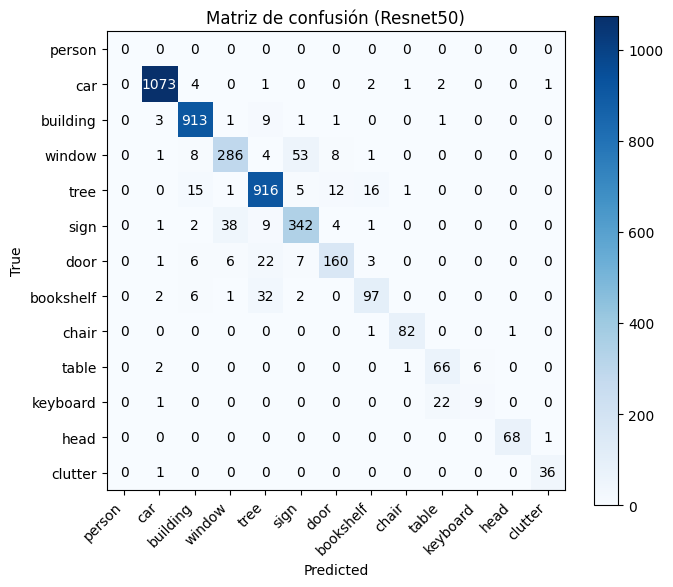

In [33]:
plot_confusion_matrix(results['resnet50']['metrics'][2], CLASS_NAMES, title=f'Matriz de confusión (Resnet50)')

In [47]:
y_true = results['resnet50']['y_true']
y_pred_resnet50 = results['resnet50']['y_pred']
print(classification_report(y_true, y_pred_resnet50, target_names=CLASS_NAMES, zero_division=0))

              precision    recall  f1-score   support

      person       0.92      0.91      0.91      1180
         car       0.88      0.94      0.91       974
    building       0.67      0.54      0.60       531
      window       0.88      0.89      0.88      1028
        tree       0.74      0.69      0.72       494
        sign       0.78      0.64      0.70       249
        door       0.75      0.54      0.63       178
   bookshelf       0.86      0.82      0.84       100
       chair       0.63      0.75      0.68        88
       table       0.45      0.17      0.24        54
    keyboard       0.93      0.91      0.92        75
        head       0.72      0.73      0.73        49
     clutter       0.88      0.91      0.90      5000

    accuracy                           0.86     10000
   macro avg       0.78      0.73      0.74     10000
weighted avg       0.86      0.86      0.86     10000



El reporte de clasificación del modelo entrenado con las features extraídas de ResNet50 muestra un accuracy global de 0.86 sobre el conjunto de prueba de 10 000 imágenes. 

En términos generales, las clases con mayor cantidad de ejemplos, como person, car, window y clutter, presentan los valores más altos de precisión y recall (entre 0.88 y 0.94). Esto indica que el modelo ha aprendido a reconocer con gran fiabilidad las categorías dominantes, lo cual era esperable dado su fuerte representación en el dataset. En particular, las clases person y car muestran un desempeño excelente (F1 ≈ 0.91), lo que refleja que las features extraídas de ResNet50 son muy discriminativas para objetos con forma y textura bien definidas.

Por otro lado, las clases menos representadas como table, door, sign y head exhiben un desempeño más modesto. La clase table destaca como la más problemática, con un F1-score de apenas 0.24, debido a un recall muy bajo (0.17). Esto sugiere que el modelo tiende a confundir mesas con otras categorías visualmente similares, probablemente por su escasa cantidad de ejemplos y la gran variabilidad visual. Clases intermedias como tree (f1 = 0.72) y sign (f1 = 0.70) presentan un rendimiento aceptable, aunque con una leve tendencia a falsos negativos, lo que indica cierta dificultad en distinguirlas en entornos complejos o con oclusiones.

La clase keyboard, a pesar de tener solo 75 ejemplos, alcanza un f1 score de 0.92, lo que evidencia que sus características visuales son muy distintivas y fáciles de capturar por el modelo. Lo mismo ocurre con bookshelf (f1 = 0.84) y head (f1 = 0.73), que, aunque menos frecuentes, conservan una buena separabilidad en el espacio de features. El desempeño general del modelo se ve reforzado por la clase clutter, que obtiene métricas equilibradas (f1 = 0.90) y demuestra que el modelo ha aprendido correctamente a diferenciar entre imágenes con un objeto central y aquellas sin estructura definida.

El promedio macro (macro avg) muestra una precisión media de 0.78 y un recall de 0.73, valores que reflejan la influencia del desbalance de clases, las categorías más raras reducen el promedio general, a pesar del excelente rendimiento en las mayoritarias. Sin embargo, el weighted avg (ponderado por soporte) mantiene un valor de 0.86, coincidente con el accuracy, lo que confirma que el modelo mantiene un equilibrio adecuado entre precisión y recall, favoreciendo ligeramente las clases más comunes.

El modelo basado en ResNet50 ha logrado aprender representaciones robustas y generalizables, con un rendimiento sobresaliente en clases frecuentes y aceptable en clases minoritarias. Las debilidades observadas en categorías con pocos ejemplos o con alta variabilidad intra clase son coherentes con el desbalance natural del dataset y podrían ser mejoradas mediante data augmentation centrada en estas clases.

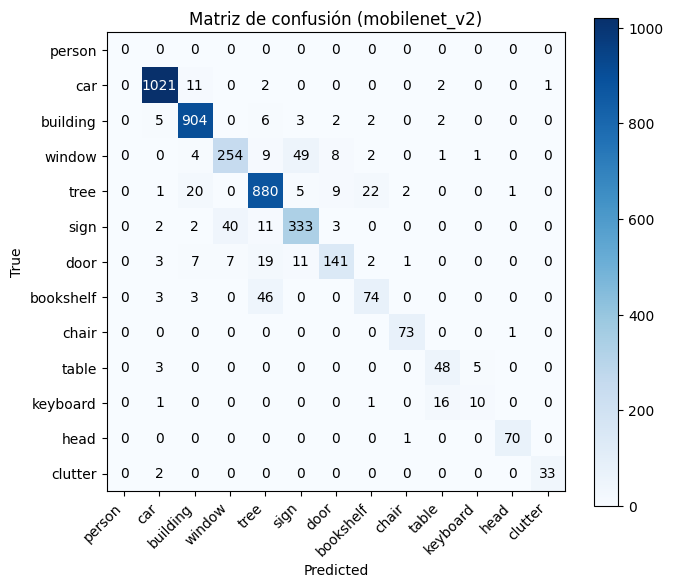

In [34]:
plot_confusion_matrix(results['mobilenet_v2']['metrics'][2], CLASS_NAMES, title=f'Matriz de confusión (mobilenet_v2)')

In [48]:
y_true = results['resnet50']['y_true']
y_pred_mobilenet2 = results['mobilenet_v2']['y_pred']
print(classification_report(y_true, y_pred_mobilenet2, target_names=CLASS_NAMES, zero_division=0))

              precision    recall  f1-score   support

      person       0.90      0.87      0.88      1180
         car       0.88      0.93      0.90       974
    building       0.66      0.48      0.55       531
      window       0.85      0.86      0.85      1028
        tree       0.74      0.67      0.70       494
        sign       0.76      0.57      0.65       249
        door       0.67      0.42      0.51       178
   bookshelf       0.81      0.73      0.77       100
       chair       0.61      0.55      0.57        88
       table       0.48      0.19      0.27        54
    keyboard       0.86      0.93      0.90        75
        head       0.80      0.67      0.73        49
     clutter       0.85      0.91      0.88      5000

    accuracy                           0.84     10000
   macro avg       0.76      0.67      0.71     10000
weighted avg       0.83      0.84      0.83     10000



El reporte de clasificación del modelo entrenado con las features extraídas de MobileNetV2 revela un rendimiento general muy sólido, alcanzando una accuracy global de 0.84 sobre el conjunto de prueba de 10 000 imágenes. 

Las clases con mayor representación (person, car, window y clutter) muestran los valores más altos de desempeño, con f1 scores entre 0.85 y 0.90. Esto indica que el modelo captura correctamente los patrones visuales de los objetos más frecuentes, y es capaz de generalizar con éxito sobre ejemplos variados. Destaca especialmente la clase car (f1 = 0.90), que muestra un recall de 0.93, lo que sugiere que el modelo reconoce vehículos con alta sensibilidad y comete pocos falsos negativos. De manera similar, la clase clutter, con f1 = 0.88, demuestra que el modelo distingue bien entre imágenes con un objeto centrado y aquellas sin estructura predominante.

Sin embargo, el desempeño disminuye de manera notable en clases menos representadas o con mayor complejidad visual. Categorías como building (f1 = 0.55), door (f1 = 0.51), sign (f1 = 0.65) y table (f1 = 0.27) presentan dificultades claras. En particular, table vuelve a ser la clase con menor recall (0.19), lo que indica una fuerte tendencia a confundir mesas con otros objetos planos o similares. Estas clases minoritarias sufren el efecto del desequilibrio de datos, que hace que el modelo aprenda representaciones menos robustas para categorías con pocos ejemplos o con alta variabilidad intra clase.

Por otro lado, algunas clases de baja frecuencia pero con formas muy distintivas muestran un rendimiento sobresaliente. Keyboard (f1 = 0.90) mantiene un nivel excelente, con un recall de 0.93, lo que evidencia que las features de MobileNetV2 son suficientemente precisas para detectar patrones geométricos y texturales claros. Bookshelf (f1 = 0.77) y head (f1 = 0.73) también presentan métricas equilibradas, confirmando que el modelo conserva la capacidad de distinguir objetos con estructuras visuales bien definidas a pesar de ser más compacto.

El promedio macro (macro avg) muestra una precisión de 0.76 y un recall de 0.67, valores algo inferiores a los del modelo basado en ResNet50 (0.78 y 0.73 respectivamente). Esta diferencia refleja que MobileNetV2, si bien eficiente, genera representaciones menos discriminativas en clases difíciles o minoritarias. En cambio, el weighted avg (ponderado por el número de ejemplos) se mantiene en 0.83, muy cercano a la accuracy, lo que confirma que el modelo sigue siendo consistente en las clases dominantes y conserva un buen equilibrio global.

El modelo entrenado con MobileNetV2 logra un buen compromiso entre precisión y eficiencia, siendo particularmente eficaz en clases comunes y visualmente distintivas. Sin embargo, su rendimiento decae en categorías escasas o ambiguas, donde las features más comprimidas de MobileNetV2 pierden cierta capacidad de separación respecto a las generadas por ResNet50. Aunque ResNet50 ofrece una representación más rica y robusta, MobileNetV2 demuestra ser una alternativa mucho más ligera y útil en entornos donde la velocidad y el uso eficiente de recursos son prioritarios.

Ahora vemos una muestra de las imágenes de test clasificadas

In [35]:
test_df['pred_resnet50'] = results['resnet50']['y_pred']

In [36]:
test_df

,img_path,label,exists,pred_resnet50
0,/kaggle/input/labelme-12-50k-tar-gz/test/0000/...,2,True,2
1,/kaggle/input/labelme-12-50k-tar-gz/test/0000/...,13,True,13
2,/kaggle/input/labelme-12-50k-tar-gz/test/0000/...,2,True,2
3,/kaggle/input/labelme-12-50k-tar-gz/test/0000/...,2,True,2
4,/kaggle/input/labelme-12-50k-tar-gz/test/0000/...,13,True,13
...,...,...,...,...
9995,/kaggle/input/labelme-12-50k-tar-gz/test/0009/...,13,True,13
9996,/kaggle/input/labelme-12-50k-tar-gz/test/0009/...,2,True,2
9997,/kaggle/input/labelme-12-50k-tar-gz/test/0009/...,3,True,6
9998,/kaggle/input/labelme-12-50k-tar-gz/test/0009/...,13,True,13


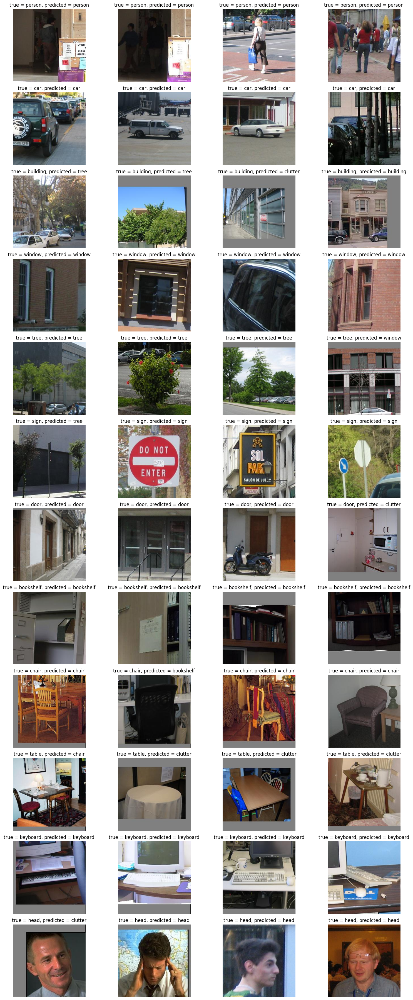

In [37]:
def show_examples_test(df, classes_to_show=range(len(CLASS_NAMES)), per_class=5, seed=RANDOM_STATE):
    random.seed(seed)
    samples = []
    for c in classes_to_show:
        sub = df[df['label'] == c]
        sub = sub[sub['exists'] == True]
        if len(sub) == 0:
            continue
        picks = sub.sample(min(per_class, len(sub)), random_state=seed)
        for _, row in picks.iterrows():
            
            samples.append((c, row['img_path'],row['pred_resnet50']))
    if not samples:
        print("No hay imágenes disponibles para mostrar.")
        return
    n = len(samples)
    cols = per_class
    rows = math.ceil(n / cols)
    plt.figure(figsize=(4*cols, 3*rows))
    for i, (c, p, pred) in enumerate(samples, 1):
        try:
            img = Image.open(p).convert('RGB')
            plt.subplot(rows, cols, i)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"true = {CLASS_NAMES[c-1]}, predicted = {CLASS_NAMES[pred-1]}")
        except Exception as e:
            pass
    plt.tight_layout()
    plt.show()

show_examples_test(test_df, classes_to_show=range(1, min(13, len(CLASS_NAMES))), per_class=4)